# Sin preprocessing

In [23]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder

# 1. Carga los datos
train = pd.read_csv("../data/train.csv")
test = pd.read_csv("../data/test.csv")
train['is_train'] = 1
test['is_train'] = 0
test['Survived'] = np.nan  # se agrega para mantener misma estructura

# 2. Unir los datasets
df = pd.concat([train, test], sort=False)

# 3. Crear nuevas variables
df['FamilySize'] = df['SibSp'] + df['Parch'] + 1
df['IsAlone'] = (df['FamilySize'] == 1).astype(int)

# Extraer título desde el nombre
df['Title'] = df['Name'].str.extract(' ([A-Za-z]+)\.', expand=False)
df['Title'] = df['Title'].replace({
    "Mlle": "Miss", "Ms": "Miss", "Mme": "Mrs", "Dr": "Rare", "Major": "Rare",
    "Col": "Rare", "Capt": "Rare", "Lady": "Rare", "Sir": "Rare",
    "Countess": "Rare", "Jonkheer": "Rare", "Don": "Rare", "Dona": "Rare", "Rev": "Rare"
})

# Extraer deck desde Cabin
df['HasCabin'] = df['Cabin'].notna().astype(int)
df['Deck'] = df['Cabin'].str[0]
df['Deck'] = df['Deck'].fillna('U')  # Unknown

# Agrupar edad
df['Age'] = df['Age'].fillna(df.groupby(['Pclass', 'Sex'])['Age'].transform('median'))
df['AgeGroup'] = pd.cut(df['Age'], bins=[0, 12, 18, 35, 60, 80], labels=['Child', 'Teen', 'Adult', 'MiddleAge', 'Senior'])

# Rellenar Fare NA (solo en test)
df['Fare'] = df['Fare'].fillna(df['Fare'].median())

# Binning de Fare
df['FareBin'] = pd.qcut(df['Fare'], 4, labels=False)

# Embarked NA (solo 2 casos en train)
df['Embarked'] = df['Embarked'].fillna(df['Embarked'].mode()[0])

# Ticket Prefix
df['TicketPrefix'] = df['Ticket'].str.extract(r'([A-Za-z\.\/]+)', expand=False).str.replace(r'\.', '', regex=True).str.replace('/', '', regex=True).fillna('NONE')

# 4. Label Encoding para todas las categóricas
label_cols = ['Sex', 'Embarked', 'Title', 'Deck', 'AgeGroup', 'TicketPrefix']
le_dict = {}
for col in label_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))
    le_dict[col] = le  # por si quieres usarlo luego en test data real

# 5. Variables finales a usar
features = [
    'Pclass', 'Sex', 'Age', 'Fare', 'Embarked', 'FamilySize', 'IsAlone',
    'Title', 'Deck', 'AgeGroup', 'FareBin', 'TicketPrefix'
]

# 6. Separar nuevamente
train_processed = df[df['is_train'] == 1][features + ['Survived']].copy()
test_processed = df[df['is_train'] == 0][features].copy()

# Agregar nuevas interacciones al feature engineering
"""train_processed['Sex_Age'] = train_processed['Sex'] * train_processed['Age']
test_processed['Sex_Age'] = test_processed['Sex'] * test_processed['Age']
"""
# Reentrenar después de agregar las columnas

from lightgbm import LGBMClassifier, early_stopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# 1. Separar features y target
X = train_processed.drop(columns=['Survived'])
y = train_processed['Survived'].astype(int)

# 2. Train/Val split
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# 3. Definir modelo
model = LGBMClassifier(
    objective='binary',
    learning_rate=0.05,
    num_leaves=31,
    n_estimators=500,
    feature_fraction=0.8,
    bagging_fraction=0.8,
    bagging_freq=5,
    random_state=42
)

# 4. Entrenamiento con early stopping via callbacks
model.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    eval_metric='binary_error',
    callbacks=[early_stopping(stopping_rounds=50)]
)

# 5. Evaluación
y_pred_val = model.predict(X_val)
acc = accuracy_score(y_val, y_pred_val)
print(f'🔍 Accuracy en validación: {acc:.4f}')

# 6. Predicción en test
test_pred = model.predict(test_processed)

# 7. Submission
submission = pd.DataFrame({
    'PassengerId': test['PassengerId'],
    'Survived': test_pred
})

submission.to_csv('../data/submission_lightgbm.csv', index=False)
print("✅ Submission guardado como 'submission_lightgbm.csv'")

<>:20: SyntaxWarning: invalid escape sequence '\.'
<>:20: SyntaxWarning: invalid escape sequence '\.'
/var/folders/15/59msbdnd3179pytbr6876h9m0000gn/T/ipykernel_4639/2043628041.py:20: SyntaxWarning: invalid escape sequence '\.'
  df['Title'] = df['Name'].str.extract(' ([A-Za-z]+)\.', expand=False)


[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Number of positive: 273, number of negative: 439
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM

In [24]:
#imprime los accuracy en train y val
y_pred_train = model.predict(X_train)
y_pred_train_binary = (y_pred_train >= 0.5).astype(int)
acc_train = accuracy_score(y_train, y_pred_train_binary)
print(f'🔍 Accuracy en entrenamiento: {acc_train:.4f}')
#imprime el accuracy en test
y_pred_test = model.predict(X_val)
y_pred_test_binary = (y_pred_test >= 0.5).astype(int)
acc_test = accuracy_score(y_val, y_pred_test_binary)
print(f'🔍 Accuracy en validacion: {acc_test:.4f}')

[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
🔍 Accuracy en entrenamiento: 0.8820
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
🔍 Accuracy en validacion: 0.7989


In [25]:
from lightgbm import LGBMClassifier, early_stopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# 1. Split
X = train_processed.drop(columns=['Survived'])
y = train_processed['Survived'].astype(int)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

# 2. Modelo con regularización y poda
model = LGBMClassifier(
    objective='binary',
    learning_rate=0.05,
    n_estimators=1000,
    num_leaves=15,
    max_depth=4,
    min_child_samples=20,
    reg_alpha=0.1,
    reg_lambda=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

# 3. Entrenar
model.fit(
    X_train, y_train,
    eval_set=[(X_val, y_val)],
    eval_metric='binary_error',
    callbacks=[early_stopping(stopping_rounds=50)]
)

# 4. Evaluación
y_pred_train = model.predict(X_train)
y_pred_val = model.predict(X_val)
acc_train = accuracy_score(y_train, y_pred_train)
acc_val = accuracy_score(y_val, y_pred_val)

print(f'🔍 Accuracy en entrenamiento: {acc_train:.4f}')
print(f'🔍 Accuracy en validación: {acc_val:.4f}')

# 6. Predicción en test
test_pred = model.predict(test_processed)

# 7. Submission
submission = pd.DataFrame({
    'PassengerId': test['PassengerId'],
    'Survived': test_pred
})

submission.to_csv('../data/submission_lightgbm_antioverfitting.csv', index=False)
print("✅ Submission guardado como 'submission_lightgbm.csv'")
#Este modelo da 77.99 accuracy en public leaderboard!

[LightGBM] [Info] Number of positive: 273, number of negative: 439
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 243
[LightGBM] [Info] Number of data points in the train set: 712, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.383427 -> initscore=-0.475028
[LightGBM] [Info] Start training from score -0.475028
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

🔍 Accuracy en entrenamiento: 0.8680

🔍 Accuracy en validación: 0.8156

con vars cruzadas

sin vars cruzadas es mucho mejor

# FT importances

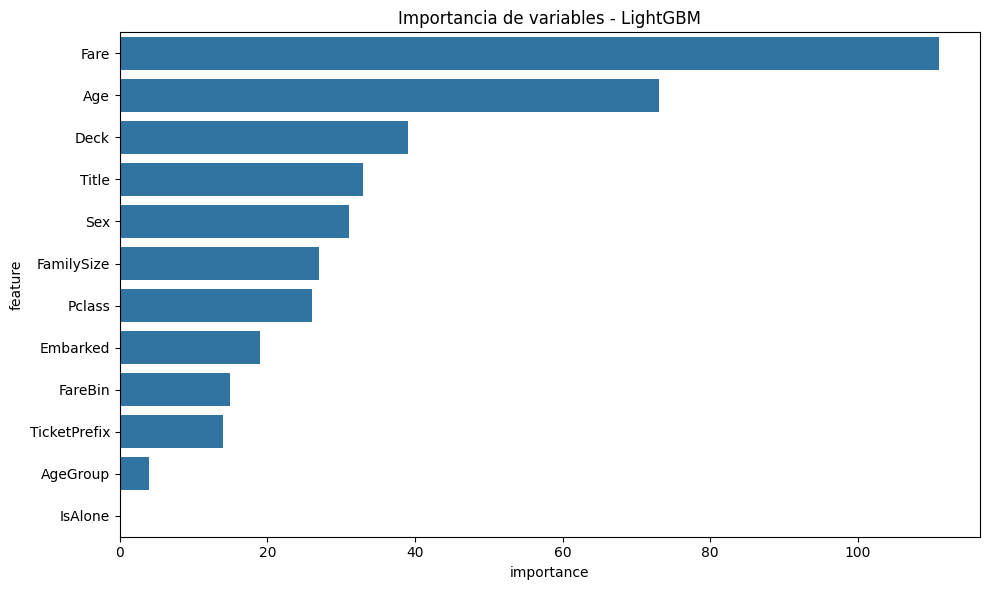

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

# Obtener importancia
importances = model.feature_importances_
feature_names = X.columns
feat_imp_df = pd.DataFrame({'feature': feature_names, 'importance': importances})
feat_imp_df = feat_imp_df.sort_values(by='importance', ascending=False)

# Graficar
plt.figure(figsize=(10, 6))
sns.barplot(data=feat_imp_df, x='importance', y='feature')
plt.title('Importancia de variables - LightGBM')
plt.tight_layout()
plt.show()

In [28]:
import optuna
from lightgbm import LGBMClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score
import pandas as pd

# Separar features y target
X = train_processed.drop(columns=['Survived'])
y = train_processed['Survived'].astype(int)

# Optuna: definir función objetivo
def objective(trial):
    params = {
        'objective': 'binary',
        'boosting_type': 'gbdt',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'num_leaves': trial.suggest_int('num_leaves', 10, 40),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_samples': trial.suggest_int('min_child_samples', 10, 50),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 1.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 1.0),
        'n_estimators': 500,
        'random_state': 42
    }
    model = LGBMClassifier(**params)
    score = cross_val_score(model, X, y, cv=5, scoring='accuracy').mean()
    return 1.0 - score  # minimizar el error

# Correr Optuna
study = optuna.create_study()
study.optimize(objective, n_trials=50)

# Mostrar mejores parámetros
print("🧠 Mejores parámetros encontrados:")
print(study.best_params)

# Entrenar modelo final con mejores parámetros
best_model = LGBMClassifier(**study.best_params)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
best_model.fit(X_train, y_train)

# Evaluación
y_pred_train = best_model.predict(X_train)
y_pred_val = best_model.predict(X_val)
acc_train = accuracy_score(y_train, y_pred_train)
acc_val = accuracy_score(y_val, y_pred_val)

print(f'🔍 Accuracy en entrenamiento: {acc_train:.4f}')
print(f'🔍 Accuracy en validación:   {acc_val:.4f}')

# Predicción en test
test_pred = best_model.predict(test_processed)

# Submission
submission = pd.DataFrame({
    'PassengerId': test['PassengerId'],
    'Survived': test_pred
})
submission.to_csv('../data/submission_optuna.csv', index=False)
print("✅ Submission guardado como 'submission_optuna.csv'")

/Users/sebastianfelipeurzuaborquez/Proyectos/Titanic Dataset/.venv/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[I 2025-05-14 22:49:55,812] A new study created in memory with name: no-name-9f32985f-571f-4249-88d2-70ed3c63506f


[LightGBM] [Info] Number of positive: 273, number of negative: 439
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 240
[LightGBM] [Info] Number of data points in the train set: 712, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.383427 -> initscore=-0.475028
[LightGBM] [Info] Start training from score -0.475028
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-05-14 22:49:58,026] Trial 0 finished with value: 0.15599774025484903 and parameters: {'learning_rate': 0.0843321937159419, 'num_leaves': 18, 'max_depth': 4, 'min_child_samples': 21, 'subsample': 0.8721819415175273, 'colsample_bytree': 0.6892014218104934, 'reg_alpha': 0.8567305817234389, 'reg_lambda': 0.8149179203942744}. Best is trial 0 with value: 0.15599774025484903.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:01,266] Trial 1 finished with value: 0.16496139602033766 and parameters: {'learning_rate': 0.1259283928530768, 'num_leaves': 34, 'max_depth': 8, 'min_child_samples': 48, 'subsample': 0.6485076133781668, 'colsample_bytree': 0.6783941735056397, 'reg_alpha': 0.032163921522867844, 'reg_lambda': 0.539044817655958}. Best is trial 0 with value: 0.15599774025484903.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 273, number of negative: 439
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 240
[LightGBM] [Info] Number of data points in the train set: 712, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.383427 -> initscore=-0.475028
[LightGBM] [Info] Start training from score -0.475028
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[I 2025-05-14 22:50:03,277] Trial 2 finished with value: 0.16610382273554714 and parameters: {'learning_rate': 0.18923914181254922, 'num_leaves': 38, 'max_depth': 5, 'min_child_samples': 21, 'subsample': 0.955070860269719, 'colsample_bytree': 0.9267591447763631, 'reg_alpha': 0.5195146703325667, 'reg_lambda': 0.8169051442446341}. Best is trial 0 with value: 0.15599774025484903.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:06,646] Trial 3 finished with value: 0.16160944071307526 and parameters: {'learning_rate': 0.018115452442709647, 'num_leaves': 27, 'max_depth': 8, 'min_child_samples': 38, 'subsample': 0.7954745386589844, 'colsample_bytree': 0.7313969609795036, 'reg_alpha': 0.2616915711877421, 'reg_lambda': 0.3212004160461496}. Best is trial 0 with value: 0.15599774025484903.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:10,107] Trial 4 finished with value: 0.15935597263197532 and parameters: {'learning_rate': 0.03775920634263396, 'num_leaves': 27, 'max_depth': 6, 'min_child_samples': 28, 'subsample': 0.6344330174381081, 'colsample_bytree': 0.7870831605079173, 'reg_alpha': 0.5270485411088168, 'reg_lambda': 0.316988131150322}. Best is trial 0 with value: 0.15599774025484903.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:12,710] Trial 5 finished with value: 0.166072437386228 and parameters: {'learning_rate': 0.09265213434089556, 'num_leaves': 32, 'max_depth': 5, 'min_child_samples': 36, 'subsample': 0.9478334468530788, 'colsample_bytree': 0.689046149488439, 'reg_alpha': 0.013084078476365946, 'reg_lambda': 0.062076232646474105}. Best is trial 0 with value: 0.15599774025484903.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:14,930] Trial 6 finished with value: 0.16496767309020144 and parameters: {'learning_rate': 0.0502355317058509, 'num_leaves': 14, 'max_depth': 4, 'min_child_samples': 24, 'subsample': 0.9154774185907675, 'colsample_bytree': 0.7800330396801446, 'reg_alpha': 0.3151405069581602, 'reg_lambda': 0.865599549291971}. Best is trial 0 with value: 0.15599774025484903.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:17,612] Trial 7 finished with value: 0.1571025045508756 and parameters: {'learning_rate': 0.11801097051445794, 'num_leaves': 20, 'max_depth': 6, 'min_child_samples': 40, 'subsample': 0.8473370142962106, 'colsample_bytree': 0.7592491886890774, 'reg_alpha': 0.6448996527057527, 'reg_lambda': 0.6893775947282063}. Best is trial 0 with value: 0.15599774025484903.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no 

[I 2025-05-14 22:50:22,259] Trial 8 finished with value: 0.16273931328855684 and parameters: {'learning_rate': 0.012459969142239194, 'num_leaves': 26, 'max_depth': 8, 'min_child_samples': 20, 'subsample': 0.8914370917948342, 'colsample_bytree': 0.7170455735684106, 'reg_alpha': 0.8480465883209979, 'reg_lambda': 0.6934113428404192}. Best is trial 0 with value: 0.15599774025484903.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 273, number of negative: 439
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 240
[LightGBM] [Info] Number of data points in the train set: 712, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.383427 -> initscore=-0.475028
[LightGBM] [Info] Start training from score -0.475028
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[I 2025-05-14 22:50:24,894] Trial 9 finished with value: 0.16047956813759345 and parameters: {'learning_rate': 0.18517477043965416, 'num_leaves': 38, 'max_depth': 9, 'min_child_samples': 49, 'subsample': 0.6449327211301291, 'colsample_bytree': 0.7967339579256116, 'reg_alpha': 0.5189979307568633, 'reg_lambda': 0.4016557703397784}. Best is trial 0 with value: 0.15599774025484903.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:26,761] Trial 10 finished with value: 0.16160316364321137 and parameters: {'learning_rate': 0.07335295997262406, 'num_leaves': 10, 'max_depth': 3, 'min_child_samples': 10, 'subsample': 0.751785771597433, 'colsample_bytree': 0.6046215733227843, 'reg_alpha': 0.9405059416401226, 'reg_lambda': 0.9871443867380265}. Best is trial 0 with value: 0.15599774025484903.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:28,237] Trial 11 finished with value: 0.15486786767936722 and parameters: {'learning_rate': 0.13484962204686965, 'num_leaves': 16, 'max_depth': 3, 'min_child_samples': 36, 'subsample': 0.8519150472201189, 'colsample_bytree': 0.9026120913654246, 'reg_alpha': 0.7460090825762449, 'reg_lambda': 0.6489409995345572}. Best is trial 11 with value: 0.15486786767936722.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:29,400] Trial 12 finished with value: 0.16833218253719162 and parameters: {'learning_rate': 0.15024810626869928, 'num_leaves': 19, 'max_depth': 3, 'min_child_samples': 11, 'subsample': 0.7419743010512322, 'colsample_bytree': 0.9042175590260675, 'reg_alpha': 0.7712594684464713, 'reg_lambda': 0.6137143907575697}. Best is trial 11 with value: 0.15486786767936722.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:31,072] Trial 13 finished with value: 0.16272675914882928 and parameters: {'learning_rate': 0.14826147693512934, 'num_leaves': 18, 'max_depth': 4, 'min_child_samples': 32, 'subsample': 0.8579960083162146, 'colsample_bytree': 0.8696087834581262, 'reg_alpha': 0.7399696079757743, 'reg_lambda': 0.8289247902179876}. Best is trial 11 with value: 0.15486786767936722.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:32,656] Trial 14 finished with value: 0.166078714456092 and parameters: {'learning_rate': 0.08452427596929775, 'num_leaves': 14, 'max_depth': 3, 'min_child_samples': 17, 'subsample': 0.9956300857839999, 'colsample_bytree': 0.981785040008285, 'reg_alpha': 0.9613208884323209, 'reg_lambda': 0.9975939620692392}. Best is trial 11 with value: 0.15486786767936722.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:34,247] Trial 15 finished with value: 0.15711505869060327 and parameters: {'learning_rate': 0.1541729154969207, 'num_leaves': 22, 'max_depth': 4, 'min_child_samples': 29, 'subsample': 0.8166918867393634, 'colsample_bytree': 0.8634299019005781, 'reg_alpha': 0.6719724399291036, 'reg_lambda': 0.46663230718703397}. Best is trial 11 with value: 0.15486786767936722.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:36,642] Trial 16 finished with value: 0.14813257171552308 and parameters: {'learning_rate': 0.11210958420755861, 'num_leaves': 15, 'max_depth': 5, 'min_child_samples': 43, 'subsample': 0.7565909163756862, 'colsample_bytree': 0.6016500345331374, 'reg_alpha': 0.8456075491563078, 'reg_lambda': 0.7108117000587187}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:38,494] Trial 17 finished with value: 0.15597890904525769 and parameters: {'learning_rate': 0.11933454676445984, 'num_leaves': 10, 'max_depth': 5, 'min_child_samples': 42, 'subsample': 0.714688248008087, 'colsample_bytree': 0.9796075002181224, 'reg_alpha': 0.9980783119755698, 'reg_lambda': 0.6673075654906477}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:41,706] Trial 18 finished with value: 0.16047956813759345 and parameters: {'learning_rate': 0.1371123500094561, 'num_leaves': 14, 'max_depth': 7, 'min_child_samples': 44, 'subsample': 0.7004275073167602, 'colsample_bytree': 0.6013694462131395, 'reg_alpha': 0.34121511162917484, 'reg_lambda': 0.17701807982684736}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:43,854] Trial 19 finished with value: 0.1638503546544472 and parameters: {'learning_rate': 0.17455994872667932, 'num_leaves': 22, 'max_depth': 10, 'min_child_samples': 34, 'subsample': 0.7790780851196135, 'colsample_bytree': 0.8433622358237503, 'reg_alpha': 0.6230674839486072, 'reg_lambda': 0.5493242262837146}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped t

[I 2025-05-14 22:50:46,233] Trial 20 finished with value: 0.1537442721737493 and parameters: {'learning_rate': 0.10652275999210861, 'num_leaves': 15, 'max_depth': 6, 'min_child_samples': 45, 'subsample': 0.827116614582278, 'colsample_bytree': 0.9365767382877636, 'reg_alpha': 0.8665032483005951, 'reg_lambda': 0.7502748526735503}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:48,984] Trial 21 finished with value: 0.1526143995982675 and parameters: {'learning_rate': 0.1068700700489637, 'num_leaves': 15, 'max_depth': 7, 'min_child_samples': 45, 'subsample': 0.822973598985466, 'colsample_bytree': 0.9344785184055824, 'reg_alpha': 0.7988075248860182, 'reg_lambda': 0.7171306675270868}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:51,378] Trial 22 finished with value: 0.14924989015127754 and parameters: {'learning_rate': 0.10366110406837825, 'num_leaves': 11, 'max_depth': 6, 'min_child_samples': 46, 'subsample': 0.8220561040043414, 'colsample_bytree': 0.9324556201332211, 'reg_alpha': 0.8677036940500249, 'reg_lambda': 0.7371684608935886}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:54,129] Trial 23 finished with value: 0.1548741447492311 and parameters: {'learning_rate': 0.06299473942454414, 'num_leaves': 11, 'max_depth': 7, 'min_child_samples': 50, 'subsample': 0.7731295214227902, 'colsample_bytree': 0.9516864635508849, 'reg_alpha': 0.8222066915696424, 'reg_lambda': 0.8755649281285146}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:56,311] Trial 24 finished with value: 0.1526143995982675 and parameters: {'learning_rate': 0.10396861155380287, 'num_leaves': 12, 'max_depth': 7, 'min_child_samples': 46, 'subsample': 0.7094828133734463, 'colsample_bytree': 0.8361527094002972, 'reg_alpha': 0.914943541532645, 'reg_lambda': 0.7453867602473282}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:50:59,070] Trial 25 finished with value: 0.15710250455087582 and parameters: {'learning_rate': 0.09982883052582957, 'num_leaves': 22, 'max_depth': 6, 'min_child_samples': 41, 'subsample': 0.8193037462345637, 'colsample_bytree': 0.9997614154343878, 'reg_alpha': 0.7032072277008881, 'reg_lambda': 0.5823672980187606}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:01,566] Trial 26 finished with value: 0.1571025045508756 and parameters: {'learning_rate': 0.06423246933613296, 'num_leaves': 12, 'max_depth': 5, 'min_child_samples': 44, 'subsample': 0.7435538275215813, 'colsample_bytree': 0.6374243145854954, 'reg_alpha': 0.5859994085219675, 'reg_lambda': 0.4600033574013484}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:04,832] Trial 27 finished with value: 0.16383780051471974 and parameters: {'learning_rate': 0.11387827705537754, 'num_leaves': 16, 'max_depth': 7, 'min_child_samples': 39, 'subsample': 0.6802929500482489, 'colsample_bytree': 0.8916993436763686, 'reg_alpha': 0.40411856323011974, 'reg_lambda': 0.7496882690447347}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:07,795] Trial 28 finished with value: 0.15037976272675913 and parameters: {'learning_rate': 0.08106696854287547, 'num_leaves': 24, 'max_depth': 9, 'min_child_samples': 47, 'subsample': 0.899616264917695, 'colsample_bytree': 0.958646405778759, 'reg_alpha': 0.8219305066600061, 'reg_lambda': 0.9329710353820012}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:10,680] Trial 29 finished with value: 0.15262067666813128 and parameters: {'learning_rate': 0.08159472381084679, 'num_leaves': 30, 'max_depth': 10, 'min_child_samples': 47, 'subsample': 0.8946271440109664, 'colsample_bytree': 0.8272490475261903, 'reg_alpha': 0.881805257399521, 'reg_lambda': 0.9468639383136029}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:13,527] Trial 30 finished with value: 0.15711505869060327 and parameters: {'learning_rate': 0.04725568127529189, 'num_leaves': 24, 'max_depth': 9, 'min_child_samples': 50, 'subsample': 0.6084796576344588, 'colsample_bytree': 0.9664488690813894, 'reg_alpha': 0.905542595527251, 'reg_lambda': 0.9146190140020503}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Info] Number of positive: 273, number of negative: 439
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000437 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 240
[LightGBM] [Info] Number of data points in the train set: 712, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.383427 -> initscore=-0.475028
[LightGBM] [Info] Start training from score -0.475028
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[I 2025-05-14 22:51:16,585] Trial 31 finished with value: 0.1526143995982675 and parameters: {'learning_rate': 0.08724062074865424, 'num_leaves': 18, 'max_depth': 9, 'min_child_samples': 43, 'subsample': 0.8748651921462038, 'colsample_bytree': 0.9263960821056759, 'reg_alpha': 0.7911049054079757, 'reg_lambda': 0.7927863929055255}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[I 2025-05-14 22:51:19,029] Trial 32 finished with value: 0.1604670139978659 and parameters: {'learning_rate': 0.13196715815992696, 'num_leaves': 17, 'max_depth': 8, 'min_child_samples': 47, 'subsample': 0.7951504376092497, 'colsample_bytree': 0.6554114898576742, 'reg_alpha': 0.8135443864148871, 'reg_lambda': 0.9059609862552549}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:21,361] Trial 33 finished with value: 0.15149080409264948 and parameters: {'learning_rate': 0.09326536900254881, 'num_leaves': 12, 'max_depth': 5, 'min_child_samples': 47, 'subsample': 0.9131029059587603, 'colsample_bytree': 0.9523650160558567, 'reg_alpha': 0.10583275265197578, 'reg_lambda': 0.794207284893346}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:23,735] Trial 34 finished with value: 0.16159688657334748 and parameters: {'learning_rate': 0.07159189173084539, 'num_leaves': 13, 'max_depth': 5, 'min_child_samples': 47, 'subsample': 0.9362385387723696, 'colsample_bytree': 0.9574987705263343, 'reg_alpha': 0.10508222412160088, 'reg_lambda': 0.8105503601669988}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:26,117] Trial 35 finished with value: 0.16496767309020155 and parameters: {'learning_rate': 0.09489868949999107, 'num_leaves': 10, 'max_depth': 5, 'min_child_samples': 38, 'subsample': 0.964464637947626, 'colsample_bytree': 0.9136735319977898, 'reg_alpha': 0.132990417443687, 'reg_lambda': 0.8541922403778569}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:28,886] Trial 36 finished with value: 0.1571025045508756 and parameters: {'learning_rate': 0.08083212013474161, 'num_leaves': 29, 'max_depth': 6, 'min_child_samples': 42, 'subsample': 0.9140074876225736, 'colsample_bytree': 0.8855045581572764, 'reg_alpha': 0.25992590262494303, 'reg_lambda': 0.7754954804280585}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 273, number of negative: 439
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 240
[LightGBM] [Info] Number of data points in the train set: 712, number of u

[I 2025-05-14 22:51:30,895] Trial 37 finished with value: 0.15486159060950333 and parameters: {'learning_rate': 0.12397469261847907, 'num_leaves': 20, 'max_depth': 4, 'min_child_samples': 48, 'subsample': 0.9733250872394629, 'colsample_bytree': 0.9971164541916167, 'reg_alpha': 0.5734709777314573, 'reg_lambda': 0.9506741948698204}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 273, number of negative: 439
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 240
[LightGBM] [Info] Number of data points in the train set: 712, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.383427 -> initscore=-0.475028
[LightGBM] [Info] Start training from score -0.475028
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2025-05-14 22:51:34,064] Trial 38 finished with value: 0.15598518611512147 and parameters: {'learning_rate': 0.05942635594199716, 'num_leaves': 36, 'max_depth': 6, 'min_child_samples': 36, 'subsample': 0.9276846197685996, 'colsample_bytree': 0.7497624559377781, 'reg_alpha': 0.44469041412390864, 'reg_lambda': 0.6497543747209532}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:36,953] Trial 39 finished with value: 0.15934969556211165 and parameters: {'learning_rate': 0.02807232182014728, 'num_leaves': 12, 'max_depth': 5, 'min_child_samples': 26, 'subsample': 0.897291250074235, 'colsample_bytree': 0.8158428692606017, 'reg_alpha': 0.14334499251254063, 'reg_lambda': 0.5272327648430857}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:39,000] Trial 40 finished with value: 0.16271420500910183 and parameters: {'learning_rate': 0.09626335271763206, 'num_leaves': 33, 'max_depth': 4, 'min_child_samples': 40, 'subsample': 0.864936230423448, 'colsample_bytree': 0.9476271176078661, 'reg_alpha': 0.6983619397113852, 'reg_lambda': 0.8841978218765951}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 273, number of negative: 439
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not 

[I 2025-05-14 22:51:41,475] Trial 41 finished with value: 0.1537442721737493 and parameters: {'learning_rate': 0.10664628000615822, 'num_leaves': 16, 'max_depth': 8, 'min_child_samples': 45, 'subsample': 0.8370690372864255, 'colsample_bytree': 0.9290213899397233, 'reg_alpha': 0.8435767185639338, 'reg_lambda': 0.7127290833789887}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:43,668] Trial 42 finished with value: 0.15373799510388542 and parameters: {'learning_rate': 0.11210135256137113, 'num_leaves': 13, 'max_depth': 6, 'min_child_samples': 50, 'subsample': 0.7944533556795308, 'colsample_bytree': 0.9679939912011383, 'reg_alpha': 0.9798019080058467, 'reg_lambda': 0.8256679313205678}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:46,110] Trial 43 finished with value: 0.15822610005649373 and parameters: {'learning_rate': 0.0738540340701414, 'num_leaves': 15, 'max_depth': 5, 'min_child_samples': 43, 'subsample': 0.7655734188809539, 'colsample_bytree': 0.724183259124768, 'reg_alpha': 0.7581610528890481, 'reg_lambda': 0.7216725285567294}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:48,982] Trial 44 finished with value: 0.1571087816207395 and parameters: {'learning_rate': 0.09219332636295323, 'num_leaves': 11, 'max_depth': 7, 'min_child_samples': 48, 'subsample': 0.8879945129322754, 'colsample_bytree': 0.9212403647325883, 'reg_alpha': 0.22846885181021387, 'reg_lambda': 0.6027279434284614}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:52,219] Trial 45 finished with value: 0.15599146318498536 and parameters: {'learning_rate': 0.12712744064363704, 'num_leaves': 20, 'max_depth': 9, 'min_child_samples': 46, 'subsample': 0.9114917391641405, 'colsample_bytree': 0.8766582821795532, 'reg_alpha': 0.05025401806968688, 'reg_lambda': 0.7918731856417738}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:54,116] Trial 46 finished with value: 0.16047329106772978 and parameters: {'learning_rate': 0.11142092015767281, 'num_leaves': 24, 'max_depth': 5, 'min_child_samples': 41, 'subsample': 0.8056337540666582, 'colsample_bytree': 0.854663188588844, 'reg_alpha': 0.927594651028573, 'reg_lambda': 0.0157151201880813}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-05-14 22:51:56,148] Trial 47 finished with value: 0.16270792793923794 and parameters: {'learning_rate': 0.1414206146034287, 'num_leaves': 40, 'max_depth': 6, 'min_child_samples': 37, 'subsample': 0.8452102589423516, 'colsample_bytree': 0.7021820500382548, 'reg_alpha': 0.800638102374542, 'reg_lambda': 0.3060901192566126}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Info] Number of positive: 273, number of negative: 439
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000428 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 240
[LightGBM] [Info] Number of data points in the train set: 712, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.383427 -> initscore=-0.475028
[LightGBM] [Info] Start training from score -0.475028
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[I 2025-05-14 22:51:58,215] Trial 48 finished with value: 0.1582323771263574 and parameters: {'learning_rate': 0.15831588632118634, 'num_leaves': 18, 'max_depth': 8, 'min_child_samples': 33, 'subsample': 0.8791313823091866, 'colsample_bytree': 0.9395077439662602, 'reg_alpha': 0.7212239515239739, 'reg_lambda': 0.6336208395834464}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requireme

[I 2025-05-14 22:52:01,181] Trial 49 finished with value: 0.1604670139978659 and parameters: {'learning_rate': 0.12030990814275022, 'num_leaves': 14, 'max_depth': 10, 'min_child_samples': 45, 'subsample': 0.996499968040446, 'colsample_bytree': 0.7683704254541514, 'reg_alpha': 0.6397142480726545, 'reg_lambda': 0.9613111671047049}. Best is trial 16 with value: 0.14813257171552308.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

In [30]:
import pandas as pd
import numpy as np
from lightgbm import LGBMClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score

# 1. Variables a eliminar por ruido
features_to_drop = ['TicketPrefix', 'Deck', 'FareBin']
X_full = train_processed.drop(columns=['Survived'] + features_to_drop)
y_full = train_processed['Survived'].astype(int)
X_test = test_processed.drop(columns=features_to_drop)

# 2. Validación cruzada estratificada
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cv_accuracies = []
models = []

for fold, (train_idx, val_idx) in enumerate(skf.split(X_full, y_full)):
    X_train, X_val = X_full.iloc[train_idx], X_full.iloc[val_idx]
    y_train, y_val = y_full.iloc[train_idx], y_full.iloc[val_idx]

    model = LGBMClassifier(
        objective='binary',
        learning_rate=0.05,
        num_leaves=15,
        max_depth=4,
        min_child_samples=20,
        reg_alpha=0.1,
        reg_lambda=0.1,
        subsample=0.8,
        colsample_bytree=0.8,
        n_estimators=500,
        random_state=42 + fold
    )

    model.fit(X_train, y_train)
    y_pred_val = model.predict(X_val)
    acc = accuracy_score(y_val, y_pred_val)
    print(f"Fold {fold+1} accuracy: {acc:.4f}")
    cv_accuracies.append(acc)
    models.append(model)

# 3. Ensemble de predicciones
test_preds = np.zeros(X_test.shape[0])
for model in models:
    test_preds += model.predict_proba(X_test)[:, 1]
test_preds /= len(models)

# Umbral final
final_preds = (test_preds >= 0.5).astype(int)

# 4. Submission
submission = pd.DataFrame({
    'PassengerId': test['PassengerId'],
    'Survived': final_preds
})
submission.to_csv('../data/submission_ensemble.csv', index=False)
print("✅ Submission guardado como '../data/submission_ensemble.csv'")

# 5. Promedio final de accuracy CV
print(f"📊 Accuracy promedio de validación cruzada: {np.mean(cv_accuracies):.4f}")

[LightGBM] [Info] Number of positive: 273, number of negative: 439
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 207
[LightGBM] [Info] Number of data points in the train set: 712, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.383427 -> initscore=-0.475028
[LightGBM] [Info] Start training from score -0.475028
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 